In [1]:
import pandas as pd
import plotly.express as px
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt

In [2]:
healthy = pd.read_csv('Healthy_Corner_Stores.csv')
grocery = pd.read_csv('Grocery_Store_Locations.csv')

In [3]:
healthy.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X          71 non-null     float64
 1   Y          71 non-null     float64
 2   OBJECTID   71 non-null     int64  
 3   STORE      71 non-null     object 
 4   ADDRESS    71 non-null     object 
 5   XCOORD     71 non-null     float64
 6   YCOORD     71 non-null     float64
 7   MATCHTYPE  71 non-null     object 
 8   MAR_ID     68 non-null     float64
 9   LATITUDE   68 non-null     float64
 10  LONGITUDE  68 non-null     float64
 11  GIS_ID     71 non-null     object 
 12  GLOBALID   71 non-null     object 
 13  CREATOR    0 non-null      float64
 14  CREATED    0 non-null      float64
 15  EDITOR     0 non-null      float64
 16  EDITED     0 non-null      float64
dtypes: float64(11), int64(1), object(5)
memory usage: 9.6+ KB


In [4]:
grocery.head()

,X,Y,STORENAME,ADDRESS,ZIPCODE,PHONE,WARD,SSL,NOTES,PRESENT90,...,XCOORD,YCOORD,MAR_ID,SE_ANNO_CAD_DATA,GLOBALID,CREATOR,CREATED,EDITOR,EDITED,PRESENT22
0,-77.026981,38.984455,Target,7828 GEORGIA AVENUE NW,20012,2028923822,Ward 4,2960 0017,NaN,NaN,...,397662.57,146280.07,300512,NaN,{CE302122-4E8D-4DC7-845B-06563B993F66},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
1,-77.026066,38.983464,International Progresso Market,7719 GEORGIA AVENUE NW,20012,2025455015,Ward 4,2961 0810,NaN,NaN,...,397741.80,146169.97,285417,NaN,{2C18863D-40DE-4F66-AA59-46F1C65D67F2},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
2,-77.027798,38.967771,Jocelyn’s Market,6404 GEORGIA AVENUE NW,20012,2027227574,Ward 4,2945 0839,NaN,NaN,...,397591.16,144428.00,285334,NaN,{A0B448C3-B3FB-49FE-B8BF-1FEBA3CEA642},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
3,-77.076459,38.965553,Magruder's,5626 CONNECTICUT AVENUE NW,20015,2024644946,Ward 3,1860 0013,,Yes,...,393373.92,144184.19,263860,NaN,{9ABE1C46-BB48-4110-B5BA-C6363CA3BD7A},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes
4,-77.074910,38.964601,Safeway,5545 CONNECTICUT AVENUE NW,20015,2022446097,Ward 3,1867 0092,,No,...,393508.13,144078.34,263999,NaN,{902F540E-FE16-43A5-8010-CD84E94B28B7},JLAY,2022/09/28 18:04:54+00,JLAY,2022/09/28 18:04:54+00,Yes


In [5]:
desired_columns_healthy = ['STORE','ADDRESS','LATITUDE','LONGITUDE']

In [6]:
healthy[desired_columns_healthy].sample(5)

,STORE,ADDRESS,LATITUDE,LONGITUDE
38,Thomas & Sons Food Market,3425 Benning Rd NE,38.895997,-76.956624
65,MLK Mini Mart,3333 MLK Jr. Ave SE,38.842406,-77.003081
26,DC Mini Mart,1828 1st Street NW,38.915139,-77.012392
64,Liff’s Market,600 Alabama Ave SE,38.843387,-76.997583
2,Capital View Convenience Store,12 Kennedy St NW,38.956431,-77.010353


In [7]:
healthy_trimmed = healthy[desired_columns_healthy].copy()

In [8]:
grocery.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 82 entries, 0 to 81
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   X                 82 non-null     float64
 1   Y                 82 non-null     float64
 2   STORENAME         82 non-null     object 
 3   ADDRESS           82 non-null     object 
 4   ZIPCODE           82 non-null     int64  
 5   PHONE             82 non-null     int64  
 6   WARD              82 non-null     object 
 7   SSL               82 non-null     object 
 8   NOTES             53 non-null     object 
 9   PRESENT90         55 non-null     object 
 10  PRESENT95         55 non-null     object 
 11  PRESENT00         55 non-null     object 
 12  PRESENT05         55 non-null     object 
 13  PRESENT08         55 non-null     object 
 14  PRESENT09         55 non-null     object 
 15  PRESENT10         55 non-null     object 
 16  PRESENT11         55 non-null     object 
 17 

In [9]:
desired_columns_grocery = ['STORENAME','ADDRESS','Y','X']

In [10]:
grocery_trimmed = grocery[desired_columns_grocery].copy()

In [11]:
grocery_trimmed['Type']= 'grocery'

In [12]:
healthy_trimmed ['Type']= 'healthy'

In [13]:
healthy_trimmed 

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type
0,BP Blaire Gas Station,7000 Blair Rd NW,38.975039,-77.019077,healthy
1,Missouri Avenue Market,5900 Georgia Ave NW,38.961518,-77.028429,healthy
2,Capital View Convenience Store,12 Kennedy St NW,38.956431,-77.010353,healthy
3,S&G Liquor and Grocery,5421 Georgia Ave NW,38.955817,-77.027747,healthy
4,Starlight Food,5424 5th St NW,NaN,NaN,healthy
...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy


In [14]:
healthy_trimmed = healthy_trimmed.dropna()

In [15]:
grocery_trimmed.columns.to_list()

['STORENAME', 'ADDRESS', 'Y', 'X', 'Type']

In [16]:
grocery_trimmed.columns = ['STORE', 'ADDRESS', 'LATITUDE', 'LONGITUDE', 'Type']

In [17]:
grocery_trimmed

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery
...,...,...,...,...,...
77,Safeway,322 40TH STREET NE,38.893140,-76.947457,grocery
78,Yes! Organic,2323 PENNSYLVANIA AVENUE SE,38.874133,-76.972748,grocery
79,Wegmans,41 RIDGE SQUARE NW,38.940451,-77.077266,grocery
80,Lidl,2224 TOWN CENTER DRIVE SE,38.861766,-76.967401,grocery


In [18]:
grocery_trimmed = grocery_trimmed.dropna()

In [19]:
all_stores = pd.concat([grocery_trimmed, healthy_trimmed], axis=0)

In [20]:
all_stores

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery
...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy


In [21]:
import folium

In [22]:
m = folium.Map(location=[38.9072, -77.0369], zoom_start=11)
m

In [23]:
all_stores['color'] = ''

In [24]:
all_stores

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type,color
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery,
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery,
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery,
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery,
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery,
...,...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy,
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy,
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy,
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy,


In [25]:
all_stores.loc[all_stores['Type'] == 'grocery', 'color'] = 'beige'
all_stores.loc[all_stores['Type'] == 'healthy', 'color'] = 'green'

In [26]:
all_stores

,STORE,ADDRESS,LATITUDE,LONGITUDE,Type,color
0,Target,7828 GEORGIA AVENUE NW,38.984455,-77.026981,grocery,beige
1,International Progresso Market,7719 GEORGIA AVENUE NW,38.983464,-77.026066,grocery,beige
2,Jocelyn’s Market,6404 GEORGIA AVENUE NW,38.967771,-77.027798,grocery,beige
3,Magruder's,5626 CONNECTICUT AVENUE NW,38.965553,-77.076459,grocery,beige
4,Safeway,5545 CONNECTICUT AVENUE NW,38.964601,-77.074910,grocery,beige
...,...,...,...,...,...,...
66,Holiday Market,3509 Wheeler Rd SE,38.839188,-76.993966,healthy,green
67,Wheeler Market,4133 Wheeler Rd SE,38.833556,-76.990215,healthy,green
68,Secrets of Nature,3923 South Capitol St SW,38.831995,-77.008576,healthy,green
69,Chesapeake Big Market,601 Chesapeake St SE,38.828998,-76.998290,healthy,green


In [27]:
for index, row in all_stores.iterrows():
    folium.Marker([row.LATITUDE, row.LONGITUDE], popup=row.STORE, tooltip=row.STORE).add_to(m)
m

In [28]:
for index, row in all_stores.iterrows():
        tooltip_text = row.STORE + ' STORE: ' + row.Type
        folium.Marker(
        [row.LATITUDE,row.LONGITUDE], 
        popup=row.STORE, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)
m

In [29]:

tracts=gpd.read_file('Census_Tracts_in_2020.geojson')
tracts.head()

,OBJECTID,TRACT,GEOID,P0010001,P0010002,P0010003,P0010004,P0010005,P0010006,P0010007,...,P0050004,P0050005,P0050006,P0050007,P0050008,P0050009,P0050010,SHAPEAREA,SHAPELEN,geometry
0,1,002002,11001002002,4072,3647,1116,1751,27,84,0,...,0,0,0,32,0,0,32,0,0,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,2,002101,11001002101,5687,5071,1037,2642,86,120,1,...,0,0,0,31,0,0,31,0,0,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."
2,3,002102,11001002102,5099,4599,901,2910,50,87,0,...,0,0,0,145,0,0,145,0,0,"POLYGON ((-77.01997 38.95819, -77.01997 38.958..."
3,4,002201,11001002201,3485,3138,973,1722,21,94,2,...,6,0,0,0,0,0,0,0,0,"POLYGON ((-77.02743 38.95188, -77.02740 38.951..."
4,5,002202,11001002202,3339,2957,619,1636,48,57,3,...,0,0,0,4,0,0,4,0,0,"POLYGON ((-77.01968 38.95209, -77.01963 38.951..."


In [30]:
folium.GeoJson(tracts, name="geojson").add_to(m)
folium.LayerControl().add_to(m)
m

In [31]:
df = pd.read_csv('R13295338_SL140.csv')

In [32]:
df = pd.read_csv(
    'R13295338_SL140.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [33]:
df = df.dropna(axis=1,how="all")

In [34]:
columns_to_keep = ['Geo_FIPS',
                   'SE_A14006_001']

df2 = df[columns_to_keep]

In [35]:
columns = list(df2) 
columns

['Geo_FIPS', 'SE_A14006_001']

In [36]:
df2.columns = ['FIPS',
'Median Household Income']

In [37]:
tracts = tracts[['TRACT','geometry']]
tracts.head()

,TRACT,geometry
0,002002,"POLYGON ((-77.03642 38.94975, -77.03643 38.948..."
1,002101,"POLYGON ((-77.02824 38.95813, -77.02824 38.958..."
2,002102,"POLYGON ((-77.01997 38.95819, -77.01997 38.958..."
3,002201,"POLYGON ((-77.02743 38.95188, -77.02740 38.951..."
4,002202,"POLYGON ((-77.01968 38.95209, -77.01963 38.951..."


In [38]:
tracts['FIPS'] ='11' + '001' + tracts['TRACT']

In [39]:
tracts_income=tracts.merge(df2,on="FIPS")

In [40]:
tracts_income = tracts_income.dropna(axis=1,how="all")

<AxesSubplot: >

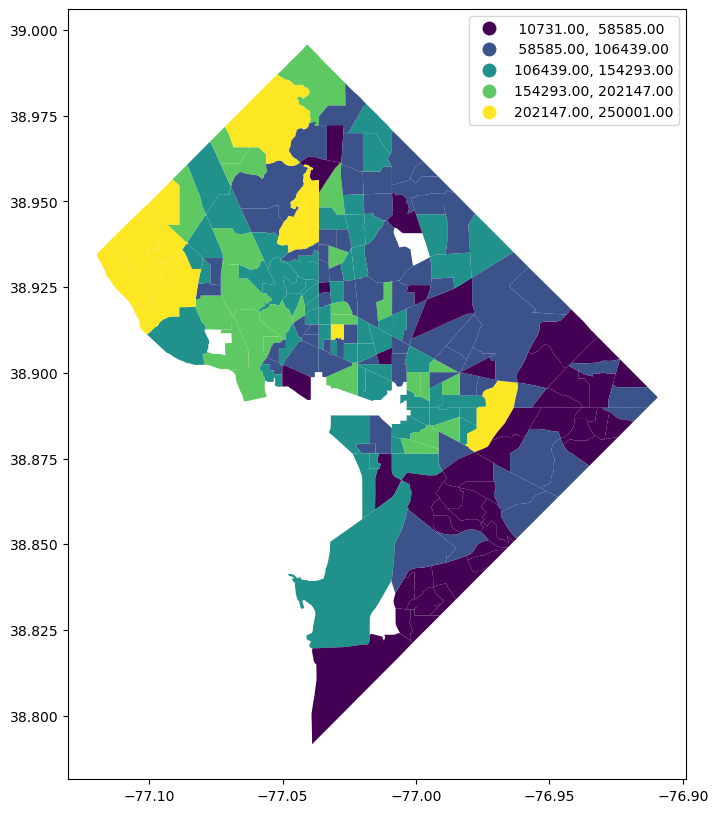

In [41]:
tracts_income.plot(figsize=(12,10),
                 column='Median Household Income',
                 legend=True, 
                 scheme='equal_interval')

In [42]:
m = folium.Map(location=[38.9072, -77.0369], 
               zoom_start = 11,
               tiles='CartoDB positron', 
               attribution='CartoDB')

In [43]:
folium.Choropleth(
                  geo_data=tracts_income, 
                  data=tracts_income,         
                  key_on='feature.properties.FIPS', 
                  columns=['FIPS', 'Median Household Income'], 
                  fill_color='BuPu',
                  line_weight=0.1, 
                  fill_opacity=0.8,
                  line_opacity=0.2, 
                  legend_name='Median Household Income').add_to(m) 

In [44]:
m

In [45]:
for index, row in all_stores.iterrows():
        tooltip_text = row.STORE + ' STORE: ' + row.Type
        folium.Marker(
        [row.LATITUDE,row.LONGITUDE], 
        popup=row.STORE, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)
m

In [53]:
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Legend (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:orange;opacity:0.7;'></span>Grocery Stores</li>
    <li><span style='background:green;opacity:0.7;'></span>Healthy Corner Stores</li>

  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

m

In [46]:
tracts_income.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [47]:
tracts_income_wm = tracts_income.to_crs(epsg=3857)

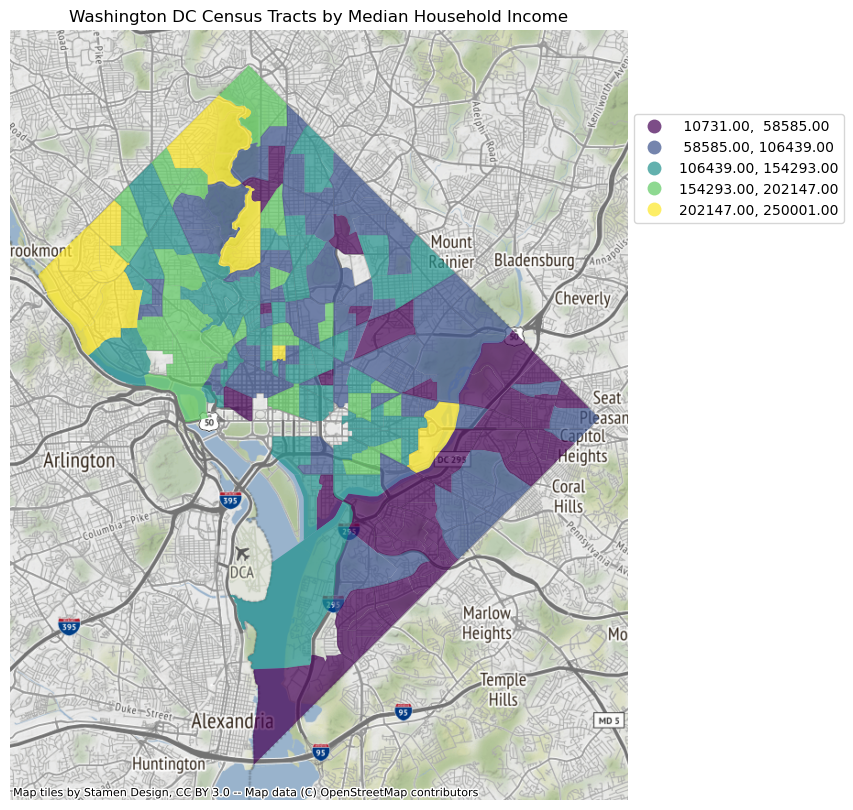

In [48]:
fig, ax = plt.subplots(figsize=(10,10))
tracts_income_wm.plot(figsize=(12,10),
                 column='Median Household Income',
                 legend=True, 
                 ax=ax,
                 legend_kwds={'loc':'upper left','bbox_to_anchor':(1,.9)},
                 scheme='equal_interval', alpha=0.7)
ax.set_title('Washington DC Census Tracts by Median Household Income')
ctx.add_basemap(ax)
ax.set_axis_off()

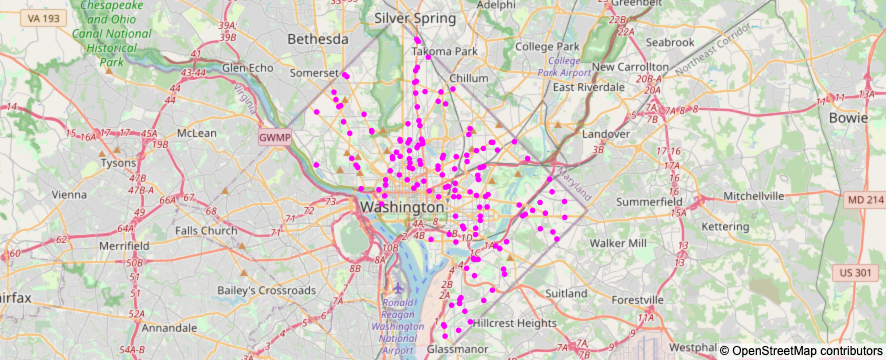

In [49]:
fig = px.scatter_mapbox(all_stores, lat="LATITUDE", lon="LONGITUDE", hover_name="STORE", hover_data=["ADDRESS", "Type"],
                        color_discrete_sequence=["fuchsia"], zoom=10, height=300)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()